In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import TensorDataset, DataLoader, random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
import numpy as np
import matplotlib.pyplot as plt

import sys
sys.path.append("../src/")
import importlib
import structures
importlib.reload(structures)
from structures import *
#import losses
#importlib.reload(losses)
#from losses import *
#import trainer
#importlib.reload(trainer)
#from trainer import *
#dtype = torch.float32
#dtype = torch.double
dtype = torch.float32
torch.set_default_dtype(dtype)
torch.autograd.set_detect_anomaly(True)
# Set the device to CUDA if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

#import deepspeed
import random
sys.path.append("/mnt/home/yjo10/ceph/myutils")
import plt_utils as pu

torch.cuda.empty_cache()
import gc
# Garbage collect
gc.collect()
# Cosine‑annealing with warmup
#from timm.scheduler import create_scheduler
from types import SimpleNamespace
from tqdm import tqdm

sys.path.append("../src/")
import importlib
import dataloader
importlib.reload(dataloader)
from dataloader import *
torch.cuda.empty_cache()
import gc
# Garbage collect
gc.collect()

Using device: cuda


28

In [3]:
batch_size=64
individual = True
_dataSB28, _labelsSB28, _minmaxSB28 = loadCAMELS(field="Mtot",box="SB28", normalization=False, individual=individual)
_dataSB35, _labelsSB35, _minmaxSB35 = loadCAMELS(field="Mtot",box="SB35", normalization=False, individual=individual)
labelsSB28 = torch.tensor(_labelsSB28[:,:2], dtype=dtype)
labelsSB35 = torch.tensor(_labelsSB35[:,:2], dtype=dtype)

In [4]:
if individual:
  arr = np.arange(_dataSB35.shape[0])
  step = 10
  length = 5

  # compute all start‐indices
  starts = np.arange(0, len(arr)-length+1, step)   # [  0,  30,  60, …]
  # build a 2D index array of shape (n_chunks, length)
  idx = starts[:,None] + np.arange(length)   
  idx = idx.flatten()

  dataSB35_cutout2_norm = np.log10(_dataSB35[idx,:256,:256])
  dataSB35_cutout2_mean, dataSB35_cutout2_std =\
  dataSB35_cutout2_norm.mean(axis=(1, 2), keepdims=True), dataSB35_cutout2_norm.std(axis=(1, 2), keepdims=True)
  dataSB35_cutout2_norm = (dataSB35_cutout2_norm -  dataSB35_cutout2_mean)/dataSB35_cutout2_std

  dataSB35_cutout2_norm = torch.tensor(dataSB35_cutout2_norm,dtype=dtype).to(device)
  #labelsSB35 = (_labelsSB35-_minmaxSB35[:2,0])/(_minmaxSB35[:2,1]-_minmaxSB35[:2,0])
  _, val_set = split_expanded_dataset(dataSB35_cutout2_norm, labelsSB35, chunk_size=15, val_ratio=0.2)
  val_loaderSB35_cutout2 = DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=0)
else:
  _dataSB35_cutout, _labelsSB35_cutout, _ = loadCAMELS(field="Mtot",box="SB35",normalization=True,
                                            linear=False, buffer=0.3, individual=individual)
  arr = np.arange(_dataSB35_cutout.shape[0])
  step = 10
  length = 5

  # compute all start‐indices
  starts = np.arange(0, len(arr)-length+1, step)   # [  0,  30,  60, …]
  # build a 2D index array of shape (n_chunks, length)
  idx = starts[:,None] + np.arange(length)   
  idx = idx.flatten()

  dataSB35_cutout2 = torch.tensor(_dataSB35_cutout[idx,:256,:256],dtype=dtype).to(device)
  _, val_set = split_expanded_dataset(dataSB35_cutout2, labelsSB35, chunk_size=15, val_ratio=0.2)
  val_loaderSB35_cutout2   = DataLoader(val_set, batch_size=batch_size, shuffle=False, num_workers=0)

In [5]:
linear = False
cutout = True
#dataSB28_norm = np.log10(_dataSB28[:,:224,:224])
dataSB28_norm = np.log10(_dataSB28)
if linear:
  dataSB28_norm_max, dataSB28_norm_min = dataSB28_norm.max(), dataSB28_norm.min()
  dataSB28_norm = (dataSB28_norm -  dataSB28_norm_min)/(dataSB28_norm_max-dataSB28_norm_min)
else:
  if individual:
    dataSB28_norm_mean, dataSB28_norm_std =\
      dataSB28_norm.mean(axis=(1, 2), keepdims=True), dataSB28_norm.std(axis=(1, 2), keepdims=True)
  else:
    dataSB28_norm_mean, dataSB28_norm_std = dataSB28_norm.mean(), dataSB28_norm.std()
  dataSB28_norm = (dataSB28_norm -  dataSB28_norm_mean)/dataSB28_norm_std



if cutout:
  arr = np.arange(_dataSB35.shape[0])
  step = 10
  length = 5

  # compute all start‐indices
  starts = np.arange(0, len(arr)-length+1, step)   # [  0,  30,  60, …]
  # build a 2D index array of shape (n_chunks, length)
  idx = starts[:,None] + np.arange(length)   
  idx = idx.flatten()
  dataSB35_cutout = _dataSB35[idx,:256,:256]
  #dataSB35_cutout = np.r_[_dataSB35[:,:256,:256],_dataSB35[:,:256,256:]]
  #dataSB35_cutout = np.r_[dataSB35_cutout,_dataSB35[:,256:,:256]]
  #dataSB35_cutout = np.r_[dataSB35_cutout,_dataSB35[:,256:,256:]]
  dataSB35_cutout_norm = np.log10(dataSB35_cutout)
  #dataSB35_cutout_norm = np.log10(_dataSB35_cutout[:,:256,:256])
  if linear:
    dataSB35_cutout_norm = (dataSB35_cutout_norm -  dataSB28_norm_min)/(dataSB28_norm_max-dataSB28_norm_min)
  else:
    if individual:
      dataSB35_cutout_norm_mean, dataSB35_cutout_norm_std =\
        dataSB35_cutout_norm.mean(axis=(1, 2), keepdims=True), dataSB35_cutout_norm.std(axis=(1, 2), keepdims=True)
      dataSB35_cutout_norm = (dataSB35_cutout_norm -  dataSB35_cutout_norm_mean)/dataSB35_cutout_norm_std
    else:
      dataSB35_cutout_norm = (dataSB35_cutout_norm -  dataSB28_norm_mean)/dataSB28_norm_std


dataSB35_norm = np.log10(_dataSB35)
#dataSB35_norm = np.log10(_dataSB35[:,:256,:256])
if linear:
  dataSB35_norm_max, dataSB35_norm_min = dataSB35_norm.max(), dataSB35_norm.min()
  dataSB35_norm = (dataSB35_norm -  dataSB35_norm_min)/(dataSB35_norm_max-dataSB35_norm_min)
else:
  if individual:
    dataSB35_norm_mean, dataSB35_norm_std =\
      dataSB35_norm.mean(axis=(1, 2), keepdims=True), dataSB35_norm.std(axis=(1, 2), keepdims=True)
  else:
    dataSB35_norm_mean, dataSB35_norm_std = dataSB35_norm.mean(), dataSB35_norm.std()
  dataSB35_norm = (dataSB35_norm -  dataSB35_norm_mean)/dataSB35_norm_std


dataSB28 = torch.tensor(dataSB28_norm,dtype=dtype)
_, val_setSB28 = split_expanded_dataset(dataSB28, labelsSB28, chunk_size=15, val_ratio=0.2, shuffle=True)
val_loaderSB28 = DataLoader(val_setSB28, batch_size=batch_size, shuffle=False)

dataSB282 = torch.tensor(dataSB282_norm,dtype=dtype)
_, val_setSB282 = split_expanded_dataset(dataSB282, labelsSB282, chunk_size=15, val_ratio=0.2, shuffle=True)
val_loaderSB282 = DataLoader(val_setSB282, batch_size=batch_size, shuffle=False)

if cutout:
  dataSB35_cutout = torch.tensor(dataSB35_cutout_norm,dtype=dtype)
  _, val_setSB35_cutout = split_expanded_dataset(dataSB35_cutout, labelsSB35, chunk_size=15, val_ratio=0.2,shuffle=True)
  val_loaderSB35_cutout = DataLoader(val_setSB35_cutout, batch_size=batch_size, shuffle=False)

dataSB35 = torch.tensor(dataSB35_norm,dtype=dtype)
_, val_setSB35 = split_expanded_dataset(dataSB35, labelsSB35, chunk_size=30, val_ratio=0.2,shuffle=True)
val_loaderSB35 = DataLoader(val_setSB35, batch_size=batch_size, shuffle=False)

ValueError: operands could not be broadcast together with shapes (15360,256,256) (30720,1,1) 

### Plot

In [9]:
def get_predictions(model, val_loader, max_plots=6, device='cuda'):
    model.eval()
    predictions = []
    truths = []

    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)
            predictions.append(outputs.cpu())
            truths.append(targets.cpu())

    predictions = torch.cat(predictions, dim=0).numpy()  # [N, D]
    truths = torch.cat(truths, dim=0).numpy()            # [N, D]

    # Compute mean squared error per output dimension
    mse_per_dim = ((predictions - truths) ** 2).mean(axis=0)
    mse_total = mse_per_dim.mean()
    print(f"Validation MSE (average over {predictions.shape[1]} targets): {mse_total:.6f}")

    # Plot prediction vs truth for a few dimensions
    D = predictions.shape[1]
    plot_dims = min(D, max_plots)
    return [truths, predictions, plot_dims]

    
def get_predictions2(model, model1, val_loader, minmax, max_plots=6, device='cuda'):
    model.eval()
    model1.eval()
    predictions = []
    predictions1 = []
    truths = []

    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)
            outputs1 = model1(inputs)
            predictions.append(outputs.cpu())
            predictions1.append(outputs1.cpu())
            truths.append(targets.cpu())

    predictions = torch.cat(predictions, dim=0).numpy()  # [N, D]
    predictions1 = torch.cat(predictions1, dim=0).numpy()  # [N, D]
    predictions = np.c_[predictions,predictions1]
    truths = torch.cat(truths, dim=0).numpy()            # [N, D]
    predictions = predictions*(minmax[:2,1]-minmax[:2,0]) + minmax[:2,0]
    #truths      = truths*(minmax[:2,1]-minmax[:2,0]) + minmax[:2,0]


    # Compute mean squared error per output dimension
    mse_per_dim = ((predictions - truths) ** 2).mean(axis=0)
    mse_total = mse_per_dim.mean()
    print(f"Validation MSE (average over {predictions.shape[1]} targets): {mse_total:.6e}")

    # Plot prediction vs truth for a few dimensions
    D = predictions.shape[1]
    plot_dims = min(D, max_plots)
    return [truths, predictions, plot_dims]


def plot_per_simulation(data, max_plots=6, chunk_size=15, num_samples=None, sample_indices=None, title=""):
    truths, predictions, plot_dims = data

    # Compute mean squared error per output dimension
    mse_per_dim = ((predictions - truths) ** 2).mean(axis=0)
    mse_total = mse_per_dim.mean()
    print(f"Validation MSE (average over {predictions.shape[1]} targets): {mse_total:.6e}")
    target_name = ["$\Omega_m$", "$\sigma_8$"]

    fig, axs = plt.subplots(1, plot_dims, figsize=(5 * plot_dims, 4))
    axs = np.array(axs).reshape(-1)

    for i in range(plot_dims):
        array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
        mean = array_chunk.mean(axis=1)
        std  = array_chunk.std(axis=1)
        true = truths[::chunk_size,:]
        #print(mean)

        if sample_indices is not None:
            x    = true[sample_indices, i]
            y    = mean[sample_indices,i]
            yerr = std[sample_indices,i]
            c    = range(len(sample_indices))
        elif num_samples is not None:
            x    = true[:num_samples, i]
            y    = mean[:num_samples,i]
            yerr = std[:num_samples,i]
        else:
            x    = true
            y    = mean
            yerr = std
        
        bias_of_each = np.mean(truths[:, i] - predictions[:, i])
        bias_of_mean =  np.mean(x - y)
        std_of_each = np.std(truths[:, i] - predictions[:, i])
        mean_std = np.mean(yerr)
        textstr = f'bias_of_each={bias_of_each:.3e}\nstd_of_each={std_of_each:.3e}\nbias_of_mean={bias_of_mean:.3e}\nmean_std={mean_std:.3e}'

        #axs[i].scatter(truths[:, i], predictions[:, i], alpha=0.6, edgecolors='k')
        axs[i].errorbar(x=x, y=y, yerr=yerr,
                        fmt='none',
                        markersize=2,        # size of the markers
                        capsize=2,           # length of the error bar caps
                        elinewidth=1.,      # width of the error bar lines
                        markeredgewidth=.5,   # edge width of the marker
                        markerfacecolor='none',
                        markeredgecolor='none',
                        ecolor='tab:orange')

        # overplot your dots with individual colors
        if sample_indices is not None:
            axs[i].scatter(x, y,
                c=c,
                cmap='viridis',
                s=16,           # marker size
                edgecolor='none',
                zorder=10)  # optional edge
        else:
            axs[i].scatter(x, y,
                s=4,           # marker size
                c="k",
                edgecolor='none',
                zorder=10)  # optional 
        axs[i].plot([truths[:, i].min(), truths[:, i].max()],
                    [truths[:, i].min(), truths[:, i].max()],
                    'r--', label='Ideal',zorder=11)
                    # Text to show

        # Place text in bottom right corner
        axs[i].text(
            0.95, 0.05, textstr,
            transform=axs[i].transAxes,
            fontsize=10,
            verticalalignment='bottom',
            horizontalalignment='right',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='lightgray', alpha=0.5)
        )
        axs[i].set_title(f"Target {target_name[i]} | MSE: {mse_per_dim[i]:.4e}")
        axs[i].set_xlabel("Truth")
        axs[i].set_ylabel("Prediction")
        axs[i].legend()
        axs[i].grid(True)
    fig.suptitle(title)
        #axs[i].set_xlim((0.4,0.7))
        #axs[i].set_ylim((0.4,0.7))
        #axs[i].set_aspect('equal')

    #plt.tight_layout()
    #plt.show()

    return 

def residual(data, data_cutout, max_plots=6, chunk_size=15, num_samples=None, sample_indices=None):
    truths_cutout, predictions_cutout, plot_dims_cutout = data_cutout
    truths, predictions, plot_dims = data

    fig, axs = plt.subplots(1, plot_dims, figsize=(5 * plot_dims, 4),
                            gridspec_kw={'wspace': 0.4,  # horizontal space between plots (fraction of subplot width)
                                        'hspace': 0.3})
    axs = np.array(axs).reshape(-1)

    for i in range(plot_dims):
        array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
        mean = array_chunk.mean(axis=1)
        std  = array_chunk.std(axis=1)
        true = truths[::chunk_size,:]

        array_chunk = predictions_cutout.reshape(-1,chunk_size,plot_dims)
        mean_cutout = array_chunk.mean(axis=1)
        std_cutout  = array_chunk.std(axis=1)
        true_cutout = truths_cutout[::chunk_size,:]
        #print(mean)
        if sample_indices is not None:
            x_cutout    = true_cutout[sample_indices, i]
            y_cutout    = mean_cutout[sample_indices,i]
            yerr_cutout = std_cutout[sample_indices,i]
            x    = true_cutout[sample_indices, i]
            y    = mean[sample_indices,i]
            yerr = std[sample_indices,i]
            c    = range(len(sample_indices))
        elif num_samples is not None:
            x_cutout    = true_cutout[:num_samples, i]
            y_cutout    = mean_cutout[:num_samples,i]
            yerr_cutout = std_cutout[:num_samples,i]
            x    = true[:num_samples, i]
            y    = mean[:num_samples,i]
            yerr = std[:num_samples,i]
            c    = range(num_samples)
        else:
            x_cutout    = true_cutout
            y_cutout    = mean_cutout
            yerr_cutout = std_cutout
            x    = true
            y    = mean
            yerr = std
            c    = range(len(std))
            

        #axs[i].scatter(truths[:, i], predictions[:, i], alpha=0.6, edgecolors='k')
        """
        axs[i].errorbar(x=x, y=y, yerr=yerr,
                        fmt='none',
                        markersize=4,        # size of the markers
                        capsize=4,           # length of the error bar caps
                        elinewidth=1.5,      # width of the error bar lines
                        markeredgewidth=1,   # edge width of the marker
                        markerfacecolor='none',
                        markeredgecolor='none',
                        ecolor='tab:orange')"""
        # overplot your dots with individual colors
        axs[i].scatter(x, y-y_cutout,
            c=c,
            cmap='viridis',
            s=16,           # marker size
            edgecolor='none',
            zorder=10)  # optional edge
        """axs[i].plot([truths[:, i].min(), truths[:, i].max()],
                    [truths[:, i].min(), truths[:, i].max()],
                    'r--', label='Ideal')"""
        axs[i].axhline(y=0,c='r', ls="--", lw=2)
        axs[i].set_title(f"Target {i}")
        axs[i].set_xlabel("Truth")
        axs[i].set_ylabel("SB35 - SB35_cutout")
        axs[i].legend()
        axs[i].grid(True)
        #axs[i].set_xlim((0.4,0.7))
        #axs[i].set_ylim((0.4,0.7))
        #axs[i].set_aspect('equal')

    #plt.tight_layout()
    #plt.show()

    return 

### SB28

### Trained separately

In [10]:
import validator 
importlib.reload(validator)
from validator import *
import structures
importlib.reload(structures)
from structures import *
output_dim = 1#labelsSB28.shape[1]



model = ConventionalCNN(input_shape=(256,256), output_shape=output_dim, H=16, output_positive=True)
model.to(device)
model1 = ConventionalCNN(input_shape=(256,256), output_shape=output_dim, H=16, output_positive=True)
model1.to(device)
model2 = ConventionalCNN(input_shape=(256,256), output_shape=output_dim, H=16, output_positive=True)
model2.to(device)
model3 = ConventionalCNN(input_shape=(256,256), output_shape=output_dim, H=16, output_positive=True)
model3.to(device)
model4 = ConventionalCNN(input_shape=(512,512), output_shape=output_dim, H=16, output_positive=True)
model4.to(device)
model5 = ConventionalCNN(input_shape=(512,512), output_shape=output_dim, H=16, output_positive=True)
model5.to(device)



model.load_state_dict(torch.load("../data/models/SB28_conv_no_linear_om_no_monopole_best.pt"))
model1.load_state_dict(torch.load("../data/models/SB28_conv_no_linear_sig_no_monopole_best.pt"))
model2.load_state_dict(torch.load("../data/models/SB35_cutout_conv_no_linear_om_no_monopole_best.pt"))
model3.load_state_dict(torch.load("../data/models/SB35_cutout_conv_no_linear_sig_no_monopole_best.pt"))
model4.load_state_dict(torch.load("../data/models/SB35_conv_no_linear_om_no_monopole_best.pt"))
model5.load_state_dict(torch.load("../data/models/SB35_conv_no_linear_sig_no_monopole_best.pt"))



data28         = get_predictions2(model, model1, val_loaderSB28, _minmaxSB28, device=device)
data35_cutout  = get_predictions2(model, model1, val_loaderSB35_cutout, _minmaxSB28, device=device)
data282        = get_predictions2(model2, model3, val_loaderSB282, _minmaxSB35, device=device)
data35_cutout2  = get_predictions2(model2, model3, val_loaderSB35_cutout2, _minmaxSB35, device=device)
data35          = get_predictions2(model4, model5, val_loaderSB35, _minmaxSB35, device=device)

Validation MSE (average over 2 targets): 3.661742e-03
Validation MSE (average over 2 targets): 4.460103e-03
Validation MSE (average over 2 targets): 4.316886e-03
Validation MSE (average over 2 targets): 3.560996e-03
Validation MSE (average over 2 targets): 1.746193e-03


In [11]:
import pickle


with open('data28_no_monopole.pkl', 'wb') as f:
    pickle.dump(data28, f)
with open('data35_no_monopole.pkl', 'wb') as f:
    pickle.dump(data35, f)
with open('data35_cutout_no_monopole.pkl', 'wb') as f:
    pickle.dump(data35_cutout, f)
with open('data35_cutout2_no_monopole.pkl', 'wb') as f:
    pickle.dump(data35_cutout2, f)
with open('data28_cutout2_no_monopole.pkl', 'wb') as f:
    pickle.dump(data282, f)

Validation MSE (average over 2 targets): 1.746193e-03
Validation MSE (average over 2 targets): 3.661742e-03
Validation MSE (average over 2 targets): 4.460103e-03
Validation MSE (average over 2 targets): 4.316886e-03


/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


Validation MSE (average over 2 targets): 3.560996e-03


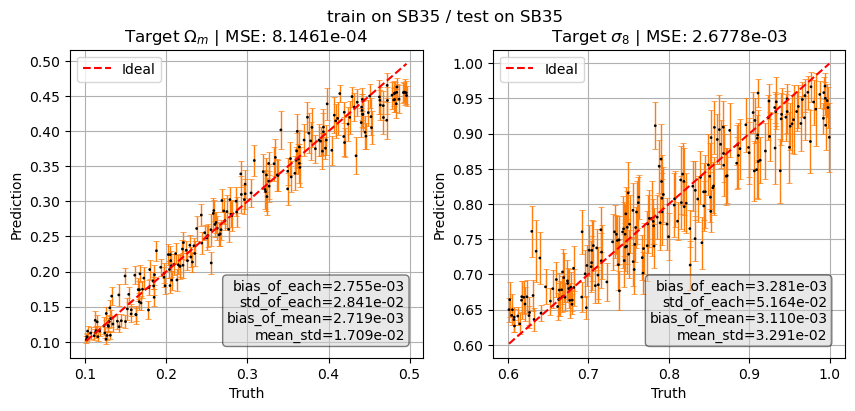

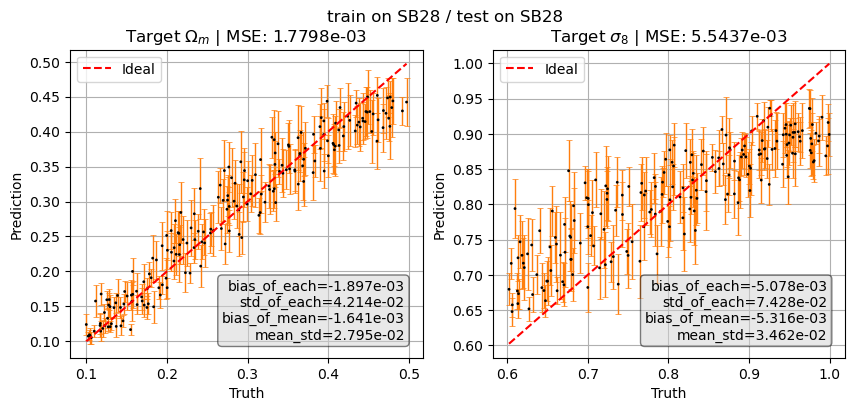

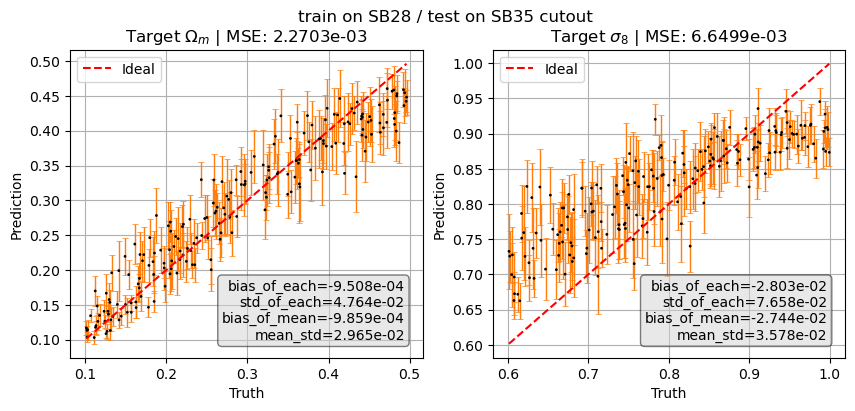

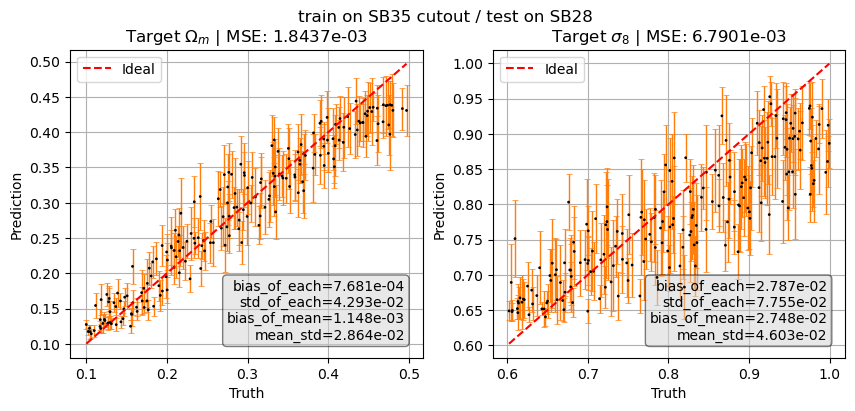

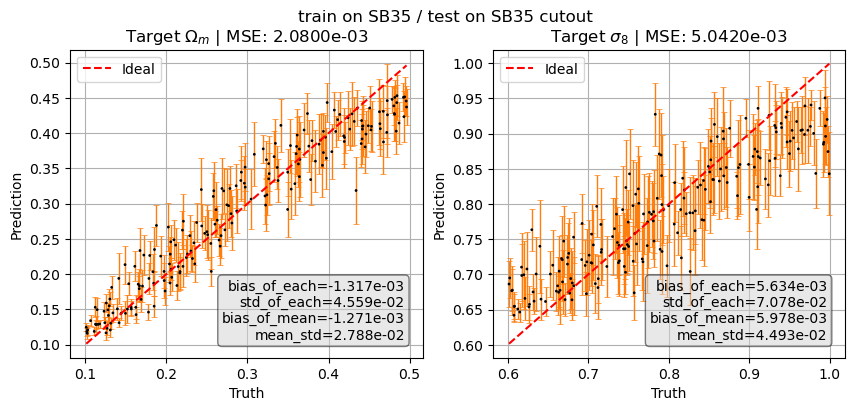

In [12]:
indices = None #range(10) #[0, 1, 2, 40]

if indices is None:
  plot_per_simulation(data35, max_plots=6, chunk_size=30,num_samples=200, title="train on SB35 / test on SB35")
  plot_per_simulation(data28, max_plots=6, chunk_size=15,num_samples=200, title="train on SB28 / test on SB28")
  plot_per_simulation(data35_cutout, max_plots=6, chunk_size=15,num_samples=200, title="train on SB28 / test on SB35 cutout")
  plot_per_simulation(data282, max_plots=6, chunk_size=15,num_samples=200, title="train on SB35 cutout / test on SB28")
  plot_per_simulation(data35_cutout2, max_plots=6, chunk_size=15,num_samples=200, title="train on SB35 / test on SB35 cutout")
else:
  plot_per_simulation(data28, max_plots=6, chunk_size=15,sample_indices=indices)
  plot_per_simulation(data35_cutout2, max_plots=6, chunk_size=15,sample_indices=indices)
  plot_per_simulation(data35_cutout, max_plots=6, chunk_size=30,sample_indices=indices)
  plot_per_simulation(data35, max_plots=6, chunk_size=30,sample_indices=indices)
plt.savefig("SB35_no_monopole.png", dpi=200, bbox_inches='tight')

Validation MSE (average over 2 targets): 3.661742e-03
Validation MSE (average over 2 targets): 4.625873e-03
Validation MSE (average over 2 targets): 4.316886e-03
Validation MSE (average over 2 targets): 3.560996e-03


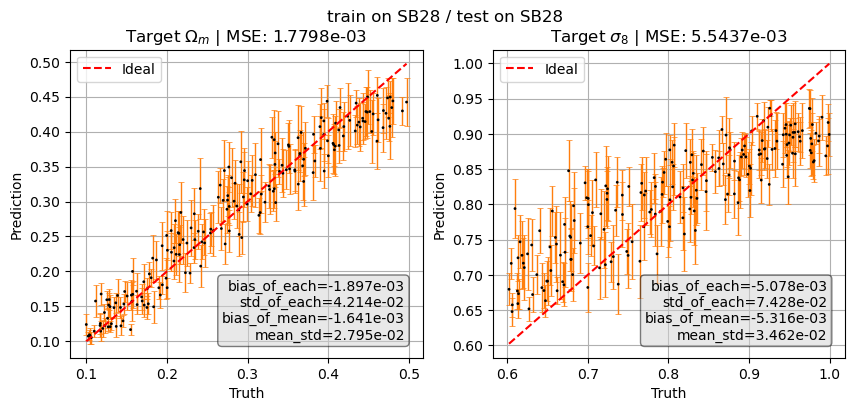

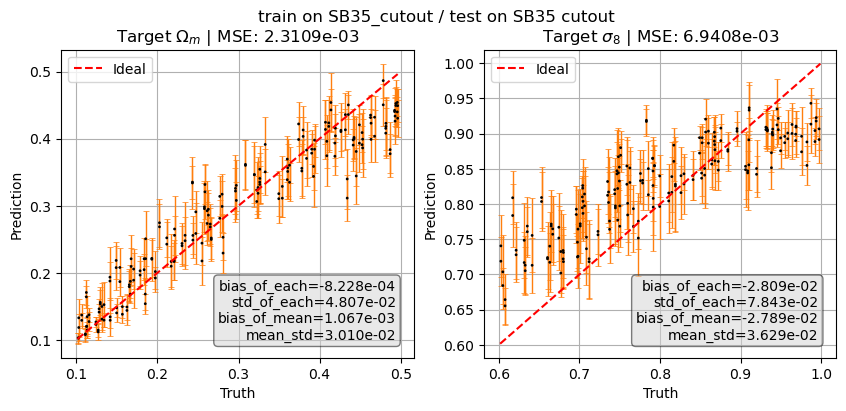

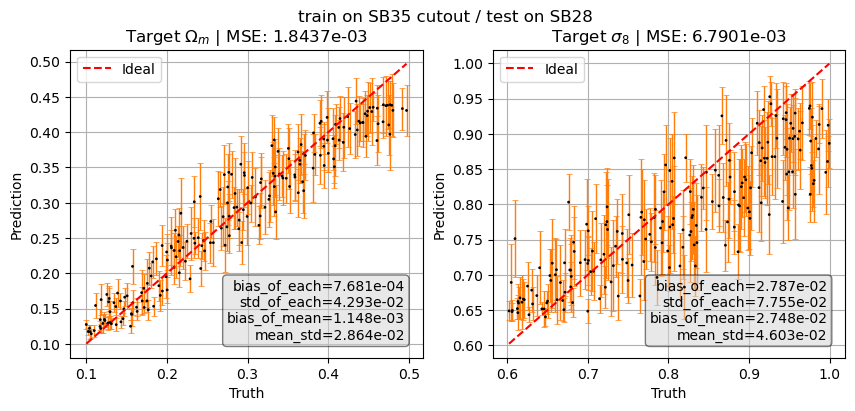

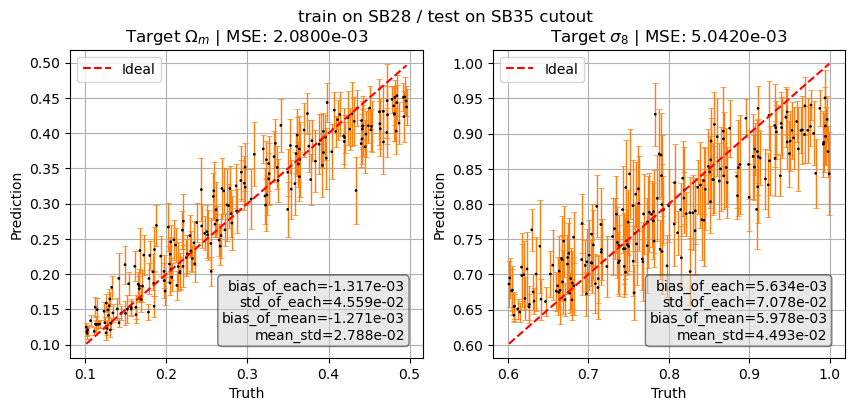

In [31]:
indices = None #range(10) #[0, 1, 2, 40]

if indices is None:
  plot_per_simulation(data28, max_plots=6, chunk_size=15,num_samples=200, title="train on SB28 / test on SB28")
  plot_per_simulation(data35_cutout, max_plots=6, chunk_size=15,num_samples=200, title="train on SB35_cutout / test on SB35 cutout")
  plot_per_simulation(data282, max_plots=6, chunk_size=15,num_samples=200, title="train on SB35 cutout / test on SB28")
  plot_per_simulation(data35_cutout2, max_plots=6, chunk_size=15,num_samples=200, title="train on SB28 / test on SB35 cutout")
else:
  plot_per_simulation(data28, max_plots=6, chunk_size=15,sample_indices=indices)
  plot_per_simulation(data35_cutout2, max_plots=6, chunk_size=15,sample_indices=indices)
  plot_per_simulation(data35_cutout, max_plots=6, chunk_size=30,sample_indices=indices)
  plot_per_simulation(data35, max_plots=6, chunk_size=30,sample_indices=indices)
#plt.savefig("train_on_SB28_test_on_both.png")

In [13]:
import pickle

with open('data28_no_monopole.pkl', 'rb') as f:
    data28 = pickle.load(f)
with open('data35_no_monopole.pkl', 'rb') as f:
    data35 = pickle.load(f)
with open('data35_cutout_no_monopole.pkl', 'rb') as f:
    data35_cutout = pickle.load(f)
with open('data35_cutout2_no_monopole.pkl', 'rb') as f:
    data35_cutout2 = pickle.load(f)
with open('data28_cutout2_no_monopole.pkl', 'rb') as f:
    data28_cutout2 = pickle.load(f)

In [14]:
truths, predictions, plot_dims = data28
chunk_size = 15
array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
mean28 = array_chunk.mean(axis=1)
std28  = array_chunk.std(axis=1)
true28 = truths[::chunk_size,:]
truths, predictions, plot_dims = data35_cutout
chunk_size = 15
array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
mean35_cutout = array_chunk.mean(axis=1)
std35_cutout  = array_chunk.std(axis=1)
true35_cutout = truths[::chunk_size,:]

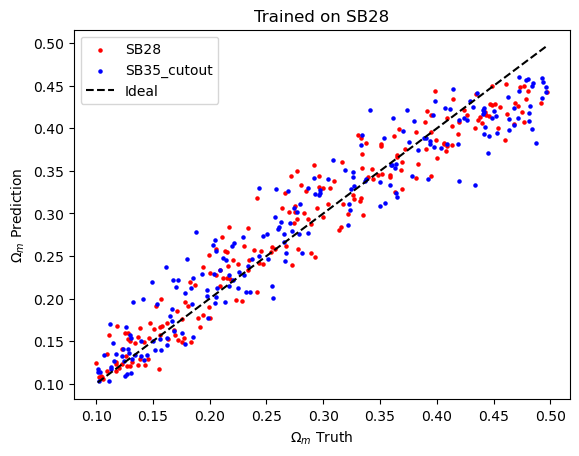

In [15]:
plt.scatter(true28[:,0], mean28[:,0], c="r", s=5, label="SB28")
plt.scatter(true35_cutout[:,0], mean35_cutout[:,0], c="b", s=5, label="SB35_cutout")
plt.plot([truths[:, 0].min(), truths[:, 0].max()],
            [truths[:, 0].min(), truths[:, 0].max()],
            'k--', label='Ideal',zorder=11)
plt.legend()
plt.title("Trained on SB28")
plt.xlabel("$\Omega_m$ Truth")
plt.ylabel("$\Omega_m$ Prediction")
plt.savefig("om_SB28_SB35_cutout_on_SB28_no_monopole.png", dpi=100, bbox_inches="tight")

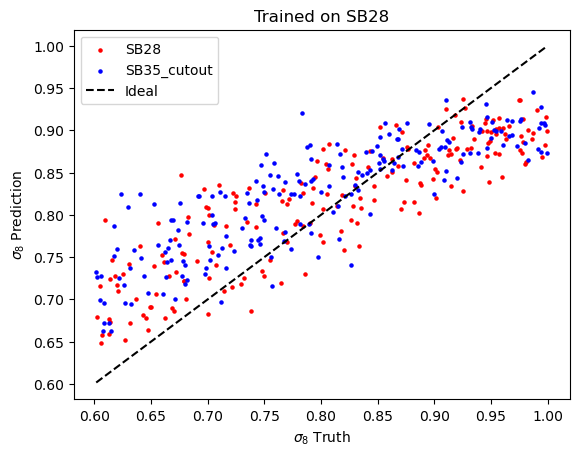

In [16]:
plt.scatter(true28[:,1], mean28[:,1], c="r", s=5, label="SB28")
plt.scatter(true35_cutout[:,1], mean35_cutout[:,1], c="b", s=5, label="SB35_cutout")
plt.plot([truths[:, 1].min(), truths[:, 1].max()],
            [truths[:, 1].min(), truths[:, 1].max()],
            'k--', label='Ideal',zorder=11)
plt.legend()
plt.title("Trained on SB28")
plt.xlabel("$\sigma_8$ Truth")
plt.ylabel("$\sigma_8$ Prediction")
plt.savefig("sig8_SB28_SB35_cutout_on_SB28_no_monopole.png", dpi=100, bbox_inches="tight")

In [17]:
truths, predictions, plot_dims = data28_cutout2
chunk_size = 15
array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
mean28_cutout2 = array_chunk.mean(axis=1)
std28_cutout2  = array_chunk.std(axis=1)
true28_cutout2 = truths[::chunk_size,:]
truths, predictions, plot_dims = data35_cutout2
chunk_size = 15
array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
mean35_cutout2 = array_chunk.mean(axis=1)
std35_cutout2  = array_chunk.std(axis=1)
true35_cutout2 = truths[::chunk_size,:]

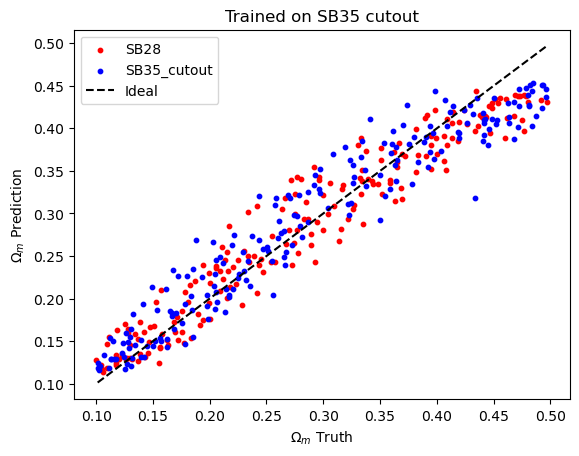

In [18]:
plt.scatter(true28_cutout2[:,0], mean28_cutout2[:,0], c="r", s=10, label="SB28")
plt.scatter(true35_cutout2[:,0], mean35_cutout2[:,0], c="b", s=10, label="SB35_cutout")
plt.plot([truths[:, 0].min(), truths[:, 0].max()],
            [truths[:, 0].min(), truths[:, 0].max()],
            'k--', label='Ideal',zorder=11)
plt.legend()
plt.title("Trained on SB35 cutout")
plt.xlabel("$\Omega_m$ Truth")
plt.ylabel("$\Omega_m$ Prediction")
plt.savefig("om_SB28_SB35_cutout_on_SB35_cutout_no_monopole.png", dpi=100, bbox_inches="tight")

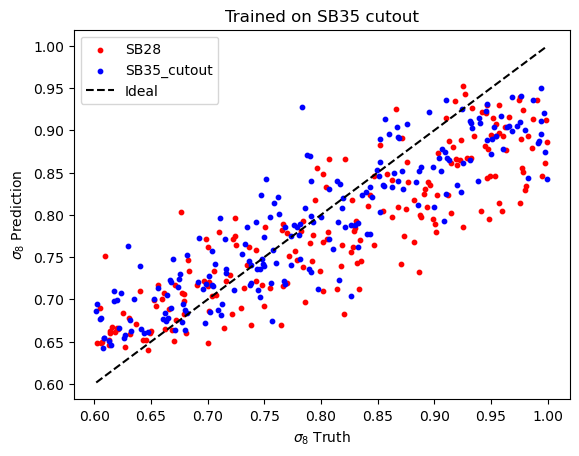

In [19]:
plt.scatter(true28_cutout2[:,1], mean28_cutout2[:,1], c="r", s=10, label="SB28")
plt.scatter(true35_cutout2[:,1], mean35_cutout2[:,1], c="b", s=10, label="SB35_cutout")
plt.plot([truths[:, 1].min(), truths[:, 1].max()],
            [truths[:, 1].min(), truths[:, 1].max()],
            'k--', label='Ideal',zorder=11)
plt.legend()
plt.title("Trained on SB35 cutout")
plt.xlabel("$\sigma_8$ Truth")
plt.ylabel("$\sigma_8$ Prediction")
plt.savefig("sig8_SB28_SB35_cutout_on_SB35_cutout_no_monopole.png", dpi=100, bbox_inches="tight")

### per snapshot

In [155]:
def residual3(data, data_cutout, max_plots=6, chunk_size=15, num_samples=None, sample_indices=None, figsize=(10,20),chunk_sample=None):
    truths_cutout, predictions_cutout, plot_dims_cutout = data_cutout
    truths, predictions, plot_dims = data
    if chunk_sample is None:
        chunk_sample = range(chunk_size)
    
    #fig, axs = plt.subplots(1, plot_dims, figsize=figsize,
    fig, axs = plt.subplots(plot_dims, 1, figsize=figsize,
                            gridspec_kw={'wspace': 0.4,  # horizontal space between plots (fraction of subplot width)
                                        'hspace': 0.5})
    axs = np.array(axs).reshape(-1)

    for i in range(plot_dims):
        array_chunk = predictions.reshape(-1,chunk_size,plot_dims)
        mean = array_chunk.mean(axis=1)
        std  = array_chunk.std(axis=1)
        true = truths[::chunk_size,:]
        x_raw = truths.reshape(-1,chunk_size,plot_dims)
        y_raw = array_chunk.copy()

        array_chunk = predictions_cutout.reshape(-1,chunk_size,plot_dims)
        mean_cutout = array_chunk.mean(axis=1)
        std_cutout  = array_chunk.std(axis=1)
        true_cutout = truths_cutout[::chunk_size,:]
        x_raw_cutout = truths_cutout.reshape(-1,chunk_size,plot_dims)
        y_raw_cutout = array_chunk.copy()
        #print(mean)
        if sample_indices is not None:
            x_raw = x_raw[sample_indices,:,i]
            y_raw = y_raw[sample_indices,:,i]
            x_raw_cutout = x_raw_cutout[sample_indices,:,i]
            y_raw_cutout = y_raw_cutout[sample_indices,:,i]

            x_cutout    = true_cutout[sample_indices,i]
            y_cutout    = mean_cutout[sample_indices,i]
            yerr_cutout = std_cutout[sample_indices,i]
            x    = true_cutout[sample_indices, i]
            y    = mean[sample_indices,i]
            yerr = std[sample_indices,i]
            c    = range(len(sample_indices))
        elif num_samples is not None:
            x_raw = x_raw[:num_samples,:,i]
            y_raw = y_raw[:num_samples,:,i]
            x_raw_cutout = x_raw_cutout[:num_samples,:,i]
            y_raw_cutout = y_raw_cutout[:num_samples,:,i]
            x_cutout    = true_cutout[:num_samples, i]
            y_cutout    = mean_cutout[:num_samples,i]
            yerr_cutout = std_cutout[:num_samples,i]
            x    = true[:num_samples, i]
            y    = mean[:num_samples,i]
            yerr = std[:num_samples,i]
            c    = range(num_samples)
        else:
            x_cutout    = true_cutout
            y_cutout    = mean_cutout
            yerr_cutout = std_cutout
            x    = true
            y    = mean
            yerr = std
            c    = range(len(std))
            

        #axs[i].scatter(truths[:, i], predictions[:, i], alpha=0.6, edgecolors='k')
        """
        axs[i].errorbar(x=x, y=y, yerr=yerr,
                        fmt='none',
                        markersize=4,        # size of the markers
                        capsize=4,           # length of the error bar caps
                        elinewidth=1.5,      # width of the error bar lines
                        markeredgewidth=1,   # edge width of the marker
                        markerfacecolor='none',
                        markeredgecolor='none',
                        ecolor='tab:orange')"""
        # overplot your dots with individual colors
        c = range(len(chunk_sample))
        s=100
        for k in range(x.shape[0]):
            #axs[i].scatter(x_raw[k,:], x_raw[k,:]-y_raw[k,:],
            axs[i].scatter(x_raw[k,chunk_sample]-y_raw[k,chunk_sample], x_raw[k,chunk_sample], 
                c=c,
                cmap='coolwarm',
                s=s,           # marker size
                marker="s",
                #edgecolor='none',
                facecolor='none',
                zorder=10)  # optional edge
            axs[i].scatter(x_raw_cutout[k,chunk_sample]-y_raw_cutout[k,chunk_sample], x_raw_cutout[k,chunk_sample], 
            #axs[i].scatter(x_raw[k,:], x_raw[k,:]-y_raw_cutout[k,:],
                c=c,
                cmap='coolwarm',
                s=s,           # marker size
                marker="^",
                #edgecolor='none',
                facecolor='none',
                zorder=10)  # optional edge
        axs[i].scatter(x-y,x, c='r', s=200)
        axs[i].scatter(x-y_cutout,x, c='b',s=200)
        """axs[i].plot([truths[:, i].min(), truths[:, i].max()],
                    [truths[:, i].min(), truths[:, i].max()],
                    'r--', label='Ideal')"""
        #axs[i].axhline(y=0,c='r', ls="--", lw=2)
        axs[i].axvline(x=0,c='r', ls="--", lw=2)
        for _x in x:
            axs[i].axhline(y=_x,c='grey', ls="--", lw=0.5,alpha=0.5)
            #axs[i].axvline(x=_x,c='grey', ls="--", lw=0.5,alpha=0.5)
        axs[i].set_title(f"Target {i}")
        axs[i].set_ylabel("Truth")
        axs[i].set_xlabel("SB35 - SB35_cutout")
        axs[i].legend()
        axs[i].grid(True)
        #axs[i].set_xlim((0.4,0.7))
        #axs[i].set_ylim((0.4,0.7))
        #axs[i].set_aspect('equal')

    #plt.tight_layout()
    #plt.show()

    return

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


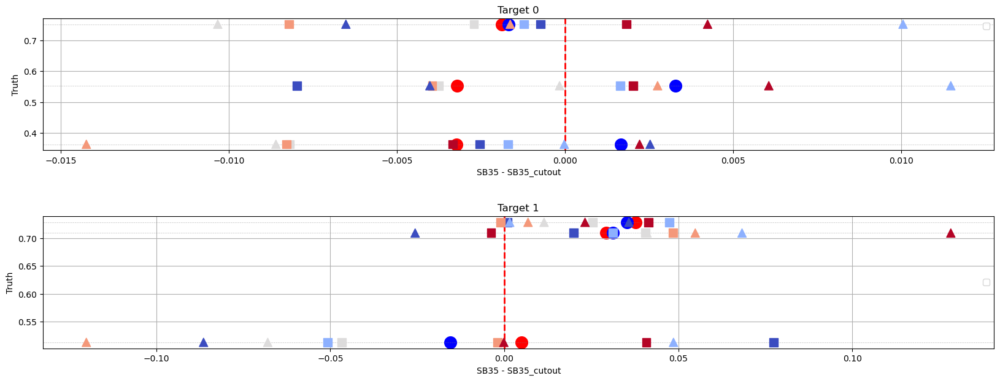

In [156]:
indices = [50,70,100]#range(10) #range(50) #[0, 1, 2, 40]
chunk_sample = [2,5,7,15,29]
figsize = (20,7)

if indices is None:
  residual3(data35, data35_cutout, max_plots=6, chunk_size=30,num_samples=200,figsize=figsize)
else:
  residual3(data35, data35_cutout, max_plots=6, chunk_size=30,sample_indices=indices,figsize=figsize,chunk_sample=chunk_sample)
#plt.savefig("train_on_SB28_test_on_both.png")

### Scatter of each simulation

In [21]:
from scipy.stats import skew

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


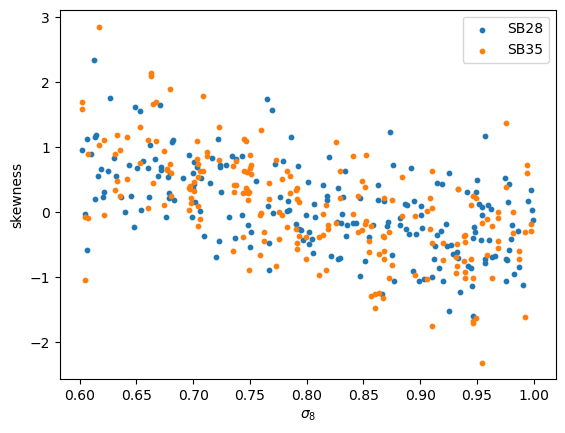

In [26]:
i=1 ## for sigma8 
truth = []
skewness = []
for j in range(data28[0].shape[0]//15):
  start = 15*j
  end = 15*(j+1)
  tmp = data28[1][start:end,i]
  skewness.append(skew(tmp))
  truth.append(data28[0][start,i])
plt.scatter(truth, skewness, label="SB28",s=10)
truth = []
skewness = []
for j in range(data35[0].shape[0]//30):
  start = 15*j
  end = 15*(j+1)
  tmp = data35[1][start:end,i]
  skewness.append(skew(tmp))
  truth.append(data35[0][start,i])
plt.scatter(truth, skewness, label="SB35",s=10)
plt.xlabel("$\sigma_8$")
plt.ylabel("skewness")
plt.legend()

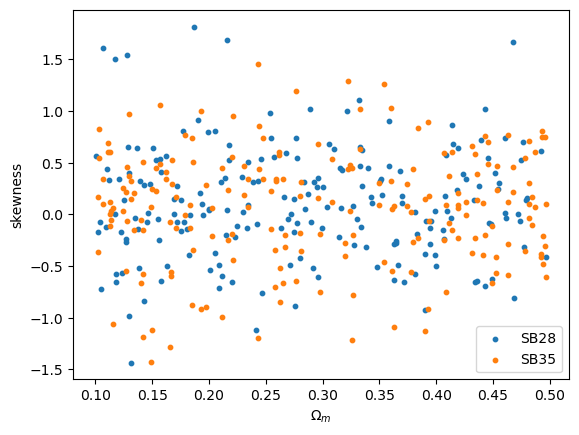

In [25]:
i=0 ## for omega_m
truth = []
skewness = []
for j in range(data28[0].shape[0]//15):
  start = 15*j
  end = 15*(j+1)
  tmp = data28[1][start:end,i]
  skewness.append(skew(tmp))
  truth.append(data28[0][start,i])
plt.scatter(truth, skewness, label="SB28",s=10)
truth = []
skewness = []
for j in range(data35[0].shape[0]//30):
  start = 15*j
  end = 15*(j+1)
  tmp = data35[1][start:end,i]
  skewness.append(skew(tmp))
  truth.append(data35[0][start,i])
plt.scatter(truth, skewness, label="SB35",s=10)
plt.xlabel("$\Omega_m$")
plt.ylabel("skewness")
plt.legend()

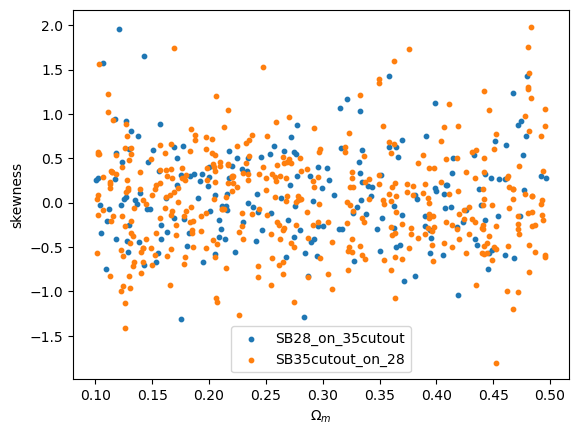

In [27]:
i=0 ## for omega_m
truth = []
skewness = []
odata = data28_cutout2
for j in range(odata[0].shape[0]//15):
  start = 15*j
  end = 15*(j+1)
  tmp = odata[1][start:end,i]
  skewness.append(skew(tmp))
  truth.append(odata[0][start,i])
plt.scatter(truth, skewness, label="SB28_on_35cutout",s=10)
truth = []
skewness = []
odata = data35_cutout
for j in range(odata[0].shape[0]//15):
  start = 15*j
  end = 15*(j+1)
  tmp = odata[1][start:end,i]
  skewness.append(skew(tmp))
  truth.append(odata[0][start,i])
plt.scatter(truth, skewness, label="SB35cutout_on_28",s=10)
plt.xlabel("$\Omega_m$")
plt.ylabel("skewness")
plt.legend()

Text(0.5, 1.0, 'skewness = 0.61130')

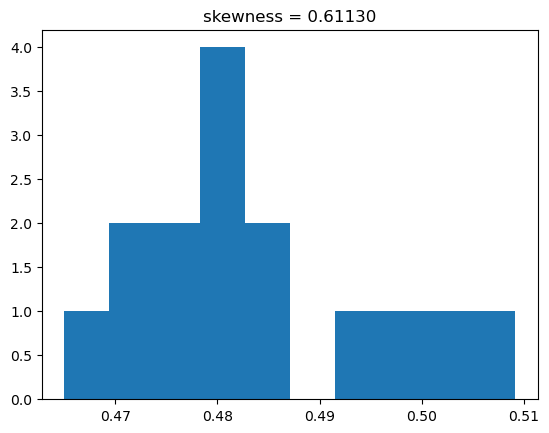

In [92]:
i=0
j=70
start = 15*j
end = 15*(j+1)
tmp = data28[1][start:end,i]
plt.hist(tmp)
plt.title("skewness = {:.5f}".format(skew(tmp)))
## skewness < 0 : left tail
## skewness > 0 : right tail

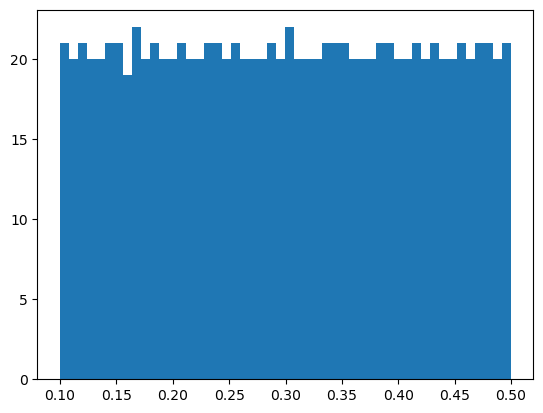

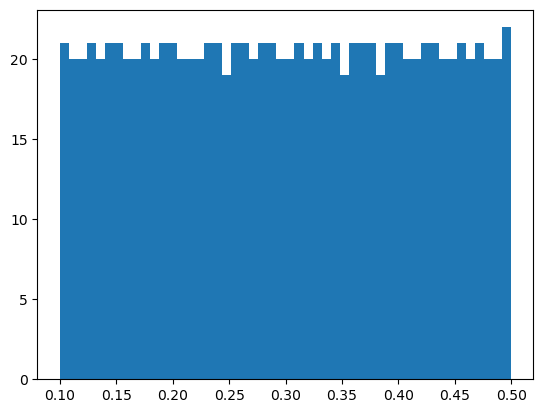

In [34]:
plt.hist(_labelsSB28[:,0],bins=50)
plt.show()
plt.hist(_labelsSB35[:,0],bins=50)
plt.show()

### parameter distribution

In [169]:
import pandas as pd
path = "/mnt/ceph/users/camels/Parameters/IllustrisTNG/CosmoAstroSeed_IllustrisTNG_L25n256_SB28.txt"
with open(path) as f:
  cols = f.readline().strip().split()
  num_cols= len(cols)
  paramsSB28 = np.loadtxt(path, usecols=range(1,num_cols))
  paramsSB28 = paramsSB28[:,:-1]
colSB28 = cols[1:-1]
path = "/mnt/ceph/users/camels/Parameters/IllustrisTNG/CosmoAstroSeed_IllustrisTNG_L50n512_SB35.txt"
with open(path) as f:
  cols = f.readline().strip().split()
  num_cols= len(cols)
  paramsSB35 = np.loadtxt(path, usecols=range(1,num_cols))
  paramsSB35 = paramsSB35[:,:-1]
colSB35 = cols[1:-1]

In [187]:
# compute histogram
data0 = paramsSB28
data  = data0[:,0]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means28 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means28[b,:] = np.mean(data0[inds, :],axis=0)  

# compute histogram
data0 = paramsSB35
data  = data0[:,0]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means35 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35[b,:] = np.mean(data0[inds, :],axis=0)  

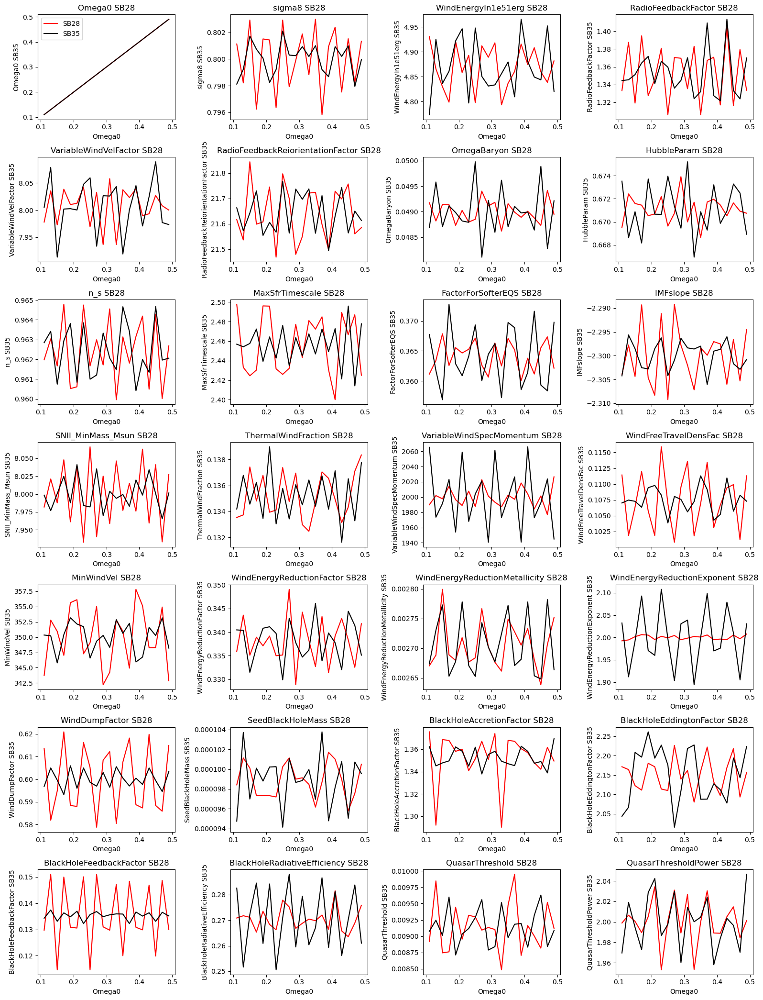

In [188]:
# example dimensions
N, M = 7, 4

# create the figure and a N×M array of Axes
fig, axes = plt.subplots(N, M, figsize=(4*M, 3*N), sharex=False, sharey=False)

# axes is a 2‑D array of shape (N, M); flatten to iterate easily
axes_flat = axes.flatten()

# Example: plot something in each subplot
for idx, ax in enumerate(axes_flat):
    # e.g. plot a random line for demo
    ax.plot(means28[:,0], means28[:,idx], c="r", label="SB28")
    ax.plot(means35[:,0], means35[:,idx], c="k", label="SB35")
    ax.set_title(colSB28[idx]+" SB28")
    ax.set_ylabel(colSB35[idx]+" SB35")
    ax.set_xlabel("Omega0")
    if idx == 0:
        ax.legend()
    
# hide any unused axes if N*M > number of plots you actually have
# for ax in axes_flat[num_plots:]:
#     ax.set_visible(False)

plt.tight_layout()
plt.show()

In [183]:
# compute histogram
data0 = paramsSB28
data  = data0[:,1]
bins = 16
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means28 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means28[b,:] = np.mean(data0[inds, :],axis=0)  

# compute histogram
data0 = paramsSB35
data  = data0[:,1]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means35 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35[b,:] = np.mean(data0[inds, :],axis=0)  

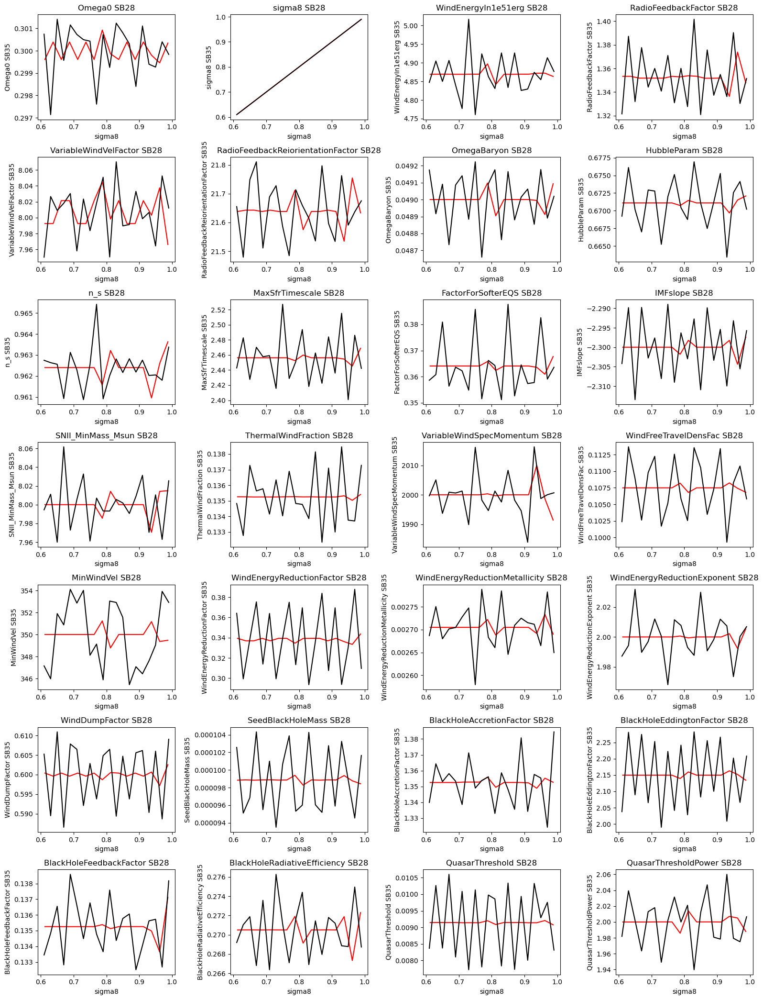

In [184]:
# example dimensions
N, M = 7, 4

# create the figure and a N×M array of Axes
fig, axes = plt.subplots(N, M, figsize=(4*M, 3*N), sharex=False, sharey=False)

# axes is a 2‑D array of shape (N, M); flatten to iterate easily
axes_flat = axes.flatten()

# Example: plot something in each subplot
for idx, ax in enumerate(axes_flat):
    # e.g. plot a random line for demo
    ax.plot(means28[:,1], means28[:,idx], c="r")
    ax.plot(means35[:,1], means35[:,idx], c="k")
    ax.set_title(colSB28[idx]+" SB28")
    ax.set_ylabel(colSB35[idx]+" SB35")
    ax.set_xlabel("sigma8")
    
# hide any unused axes if N*M > number of plots you actually have
# for ax in axes_flat[num_plots:]:
#     ax.set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
path = "/mnt/ceph/users/camels/Parameters/IllustrisTNG/CosmoAstroSeed_IllustrisTNG_L25n256_SB28.txt"
with open(path) as f:
  cols = f.readline().strip().split()
  num_cols= len(cols)
  params = np.loadtxt(path, usecols=range(1,num_cols))
colSB28 = cols[1:-1]
path = "/mnt/ceph/users/camels/Parameters/IllustrisTNG/CosmoAstroSeed_IllustrisTNG_L50n512_SB35.txt"
with open(path) as f:
  cols = f.readline().strip().split()
colSB35 = cols[1:-1]

In [157]:
# compute histogram
data0 = _labelsSB28
data  = data0[:,0]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means28 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means28[b,:] = np.mean(data0[inds, :],axis=0)  

# compute histogram
data0 = _labelsSB35
data  = data0[:,0]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means35 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35[b,:] = np.mean(data0[inds, :],axis=0)  

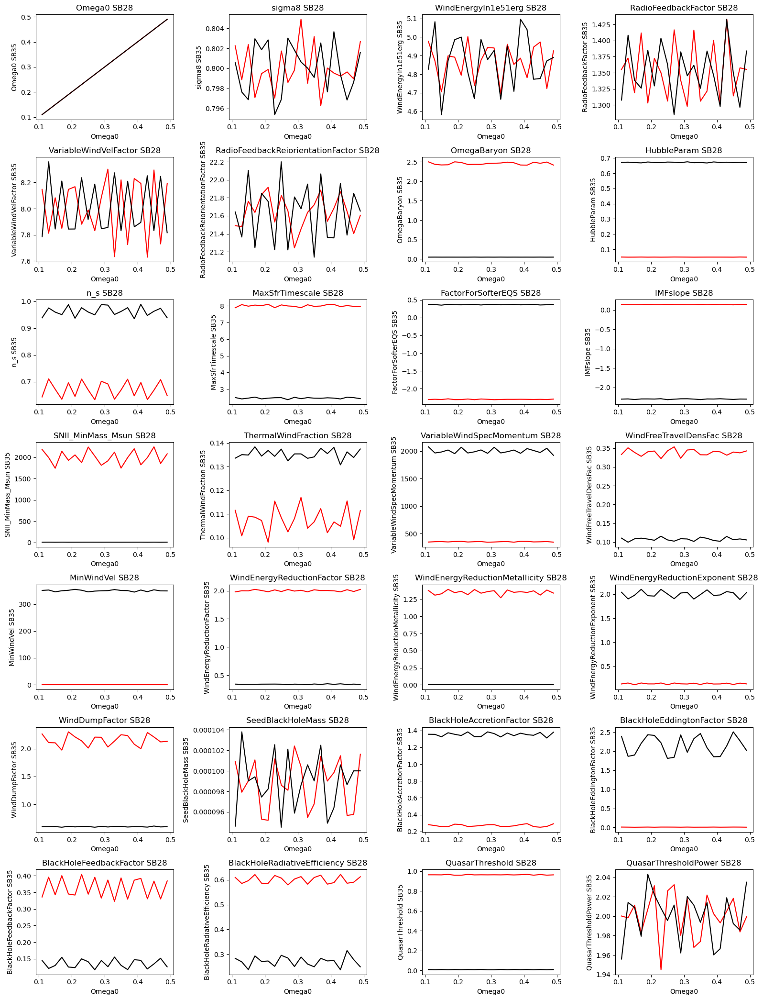

In [160]:
# example dimensions
N, M = 7, 4

# create the figure and a N×M array of Axes
fig, axes = plt.subplots(N, M, figsize=(4*M, 3*N), sharex=False, sharey=False)

# axes is a 2‑D array of shape (N, M); flatten to iterate easily
axes_flat = axes.flatten()

# Example: plot something in each subplot
for idx, ax in enumerate(axes_flat):
    # e.g. plot a random line for demo
    ax.plot(means28[:,0], means28[:,idx], c="r")
    ax.plot(means35[:,0], means35[:,idx], c="k")
    ax.set_title(colSB28[idx]+" SB28")
    ax.set_ylabel(colSB35[idx]+" SB35")
    ax.set_xlabel("Omega0")
    
# hide any unused axes if N*M > number of plots you actually have
# for ax in axes_flat[num_plots:]:
#     ax.set_visible(False)

plt.tight_layout()
plt.show()

In [161]:
# compute histogram
data0 = _labelsSB28
data  = data0[:,1]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means28 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means28[b,:] = np.mean(data0[inds, :],axis=0)  

# compute histogram
data0 = _labelsSB35
data  = data0[:,1]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means35 = np.zeros((bins,data0.shape[1]))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35[b,:] = np.mean(data0[inds, :],axis=0)  

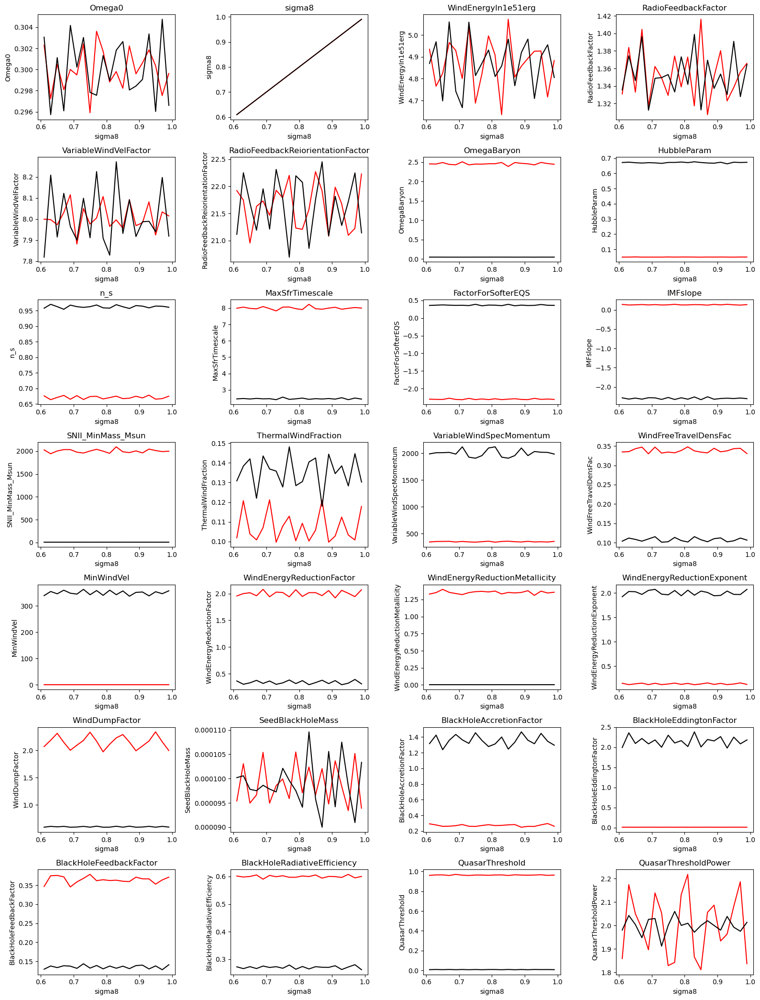

In [162]:
# example dimensions
N, M = 7, 4

# create the figure and a N×M array of Axes
fig, axes = plt.subplots(N, M, figsize=(4*M, 3*N), sharex=False, sharey=False)

# axes is a 2‑D array of shape (N, M); flatten to iterate easily
axes_flat = axes.flatten()

# Example: plot something in each subplot
for idx, ax in enumerate(axes_flat):
    # e.g. plot a random line for demo
    ax.plot(means28[:,1], means28[:,idx], c="r")
    ax.plot(means35[:,1], means35[:,idx], c="k")
    ax.set_title(colSB28[idx])
    ax.set_ylabel(colSB35[idx])
    ax.set_xlabel("sigma8")
    
# hide any unused axes if N*M > number of plots you actually have
# for ax in axes_flat[num_plots:]:
#     ax.set_visible(False)

plt.tight_layout()
plt.show()

### monopole

In [6]:
# compute histogram
data0 = _labelsSB28
data  = data0[:,0]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means28 = np.zeros((bins,16))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means28[b,15] = data[inds].mean()
  for j in range(15):
    means28[b,j] = np.mean(_dataSB28[inds*15+j,:,:])  

# compute histogram
data0 = _labelsSB35
data  = data0[:,0]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means35_cutout = np.zeros((bins,16))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35_cutout[b,15] = data[inds].mean()
  for j in range(15):
    means35_cutout[b,j] = np.mean(_dataSB35[inds*30+j,:256,:256])  
means35 = np.zeros((bins,31))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35[b,30] = data[inds].mean()
  for j in range(30):
    means35[b,j] = np.mean(_dataSB35[inds*30+j,:,:])  

/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/mnt/sw/nix/store/71ksmx7k6xy3v9ksfkv5mp5kxxp64pd6-python-3.10.13-view/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float64'> type is zero.
  return self._float_to_str(self.smallest_subnormal)


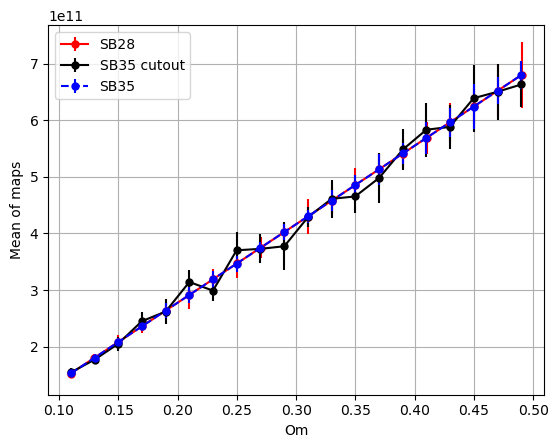

In [7]:
plt.errorbar(means28[:,15], means28[:,:15].mean(axis=1), means28[:,:15].std(axis=1), c="r", marker=".", ms=10,label='SB28')
plt.errorbar(means35_cutout[:,15], means35_cutout[:,:15].mean(axis=1), means35_cutout[:,:15].std(axis=1), c="k", ls="-", marker=".", ms=10,label='SB35 cutout')
plt.errorbar(means35[:,30], means35[:,:30].mean(axis=1), means35[:,:30].std(axis=1), c="b", ls="--", marker=".", ms=10,label='SB35')
#plt.yscale('log')

plt.xlabel("Om")
plt.ylabel("Mean of maps")
plt.legend()
plt.grid()

In [11]:
true28 = means28[:,:15].mean(axis=1).reshape(-1,1)
true35 = means35[:,:30].mean(axis=1).reshape(-1,1)

rmse28 = np.sqrt(np.mean(np.square(true28-means28[:,:15])))
rmse35 = np.sqrt(np.mean(np.square(true35-means35[:,:30])))
rmse35_cutout = np.sqrt(np.mean(np.square(true35-means35_cutout[:,:15])))

print(rmse28, rmse35, rmse35_cutout)

27489635319.015953 19339184997.496002 35974854530.07016


In [13]:
true28 = np.log10(means28[:,:15].mean(axis=1).reshape(-1,1))
true35 = np.log10(means35[:,:30].mean(axis=1).reshape(-1,1))

rmse28 = np.sqrt(np.mean(np.square(true28-np.log10(means28[:,:15]))))
rmse35 = np.sqrt(np.mean(np.square(true35-np.log10(means35[:,:30]))))
rmse35_cutout = np.sqrt(np.mean(np.square(true35-np.log10(means35_cutout[:,:15]))))

print(rmse28, rmse35, rmse35_cutout)

0.025918163729254044 0.01840182539617431 0.03484748429468357


In [90]:
means28[:,15],means35[:,30] 

(array([0.10996414, 0.12988255, 0.14980873, 0.16991702, 0.19003694,
        0.2099599 , 0.23007477, 0.25018853, 0.27012288, 0.28984562,
        0.30976767, 0.32988547, 0.34981349, 0.36972157, 0.389839  ,
        0.4099591 , 0.42988173, 0.44979924, 0.46992579, 0.49004347]),
 array([0.11015269, 0.1300844 , 0.14980157, 0.16991808, 0.19004353,
        0.20996686, 0.22987471, 0.24980451, 0.26992558, 0.29003784,
        0.30996451, 0.32987667, 0.34980353, 0.36992635, 0.39003863,
        0.4097642 , 0.42949451, 0.44960846, 0.46972314, 0.48984692]))

Text(0, 0.5, 'residual')

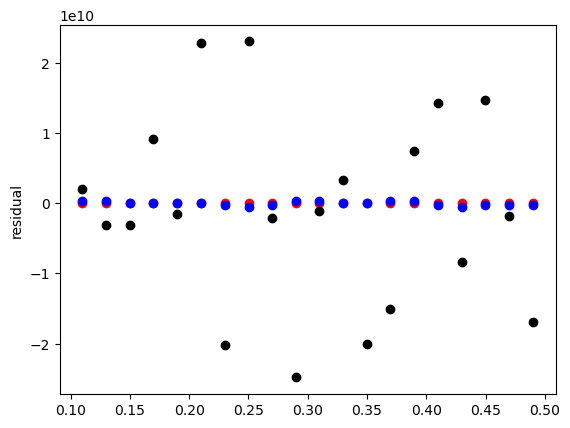

In [103]:
plt.scatter(means28[:,15], -means28[:,:15].mean(axis=1)+means28[:,:15].mean(axis=1),c="r")
plt.scatter(means28[:,15], -means28[:,:15].mean(axis=1)+means35[:,:30].mean(axis=1),c="b")
plt.scatter(means28[:,15], -means28[:,:15].mean(axis=1)+means35_cutout[:,:15].mean(axis=1), c="k")
plt.ylabel("residual")


In [126]:
# compute histogram
data0 = _labelsSB28
data  = data0[:,1]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means28 = np.zeros((bins,16))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means28[b,15] = data[inds].mean()
  for j in range(15):
    means28[b,j] = np.mean(_dataSB28[inds*15+j,:,:])  

# compute histogram
data0 = _labelsSB35
data  = data0[:,1]
bins = 20
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# now indices_per_bin[b] is an array of all i such that data[i] ∈ bin b
means35_cutout = np.zeros((bins,16))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35_cutout[b,15] = data[inds].mean()
  for j in range(15):
    means35_cutout[b,j] = np.mean(_dataSB35[inds*30+j,:256,:256])  
means35 = np.zeros((bins,31))
for b, inds in enumerate(indices_per_bin):
  #print(f"bin {b:2d} ({edges[b]:.2f}→{edges[b+1]:.2f}): {inds.size} points")
  means35[b,30] = data[inds].mean()
  for j in range(30):
    means35[b,j] = np.mean(_dataSB35[inds*30+j,:,:])  

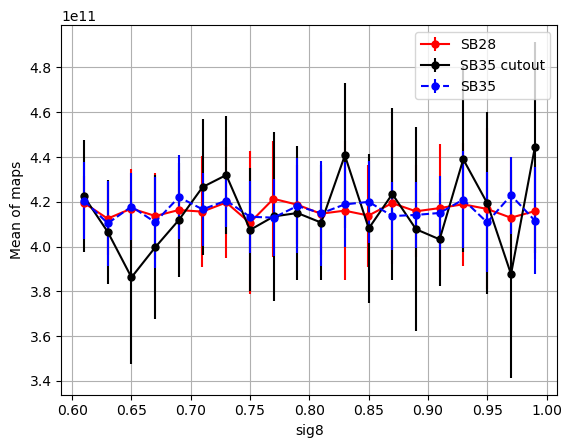

In [127]:
plt.errorbar(means28[:,15], means28[:,:15].mean(axis=1), means28[:,:15].std(axis=1), c="r", marker=".", ms=10,label='SB28')
plt.errorbar(means35_cutout[:,15], means35_cutout[:,:15].mean(axis=1), means35_cutout[:,:15].std(axis=1), c="k", ls="-", marker=".", ms=10,label='SB35 cutout')
plt.errorbar(means35[:,30], means35[:,:30].mean(axis=1), means35[:,:30].std(axis=1), c="b", ls="--", marker=".", ms=10,label='SB35')
#plt.yscale('log')
plt.xlabel("sig8")
plt.ylabel("Mean of maps")
plt.legend()
plt.grid()

Text(0, 0.5, 'residual')

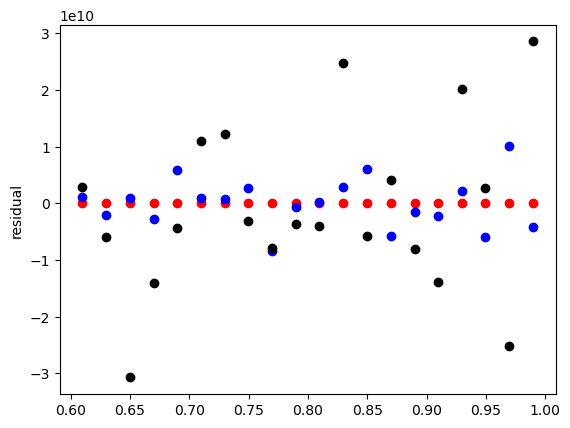

In [108]:
plt.scatter(means28[:,15], -means28[:,:15].mean(axis=1)+means28[:,:15].mean(axis=1),c="r")
plt.scatter(means28[:,15], -means28[:,:15].mean(axis=1)+means35[:,:30].mean(axis=1),c="b")
plt.scatter(means28[:,15], -means28[:,:15].mean(axis=1)+means35_cutout[:,:15].mean(axis=1), c="k")
plt.ylabel("residual")


### snapshots

In [223]:
# compute histogram
data0 = _labelsSB28
data  = data0[:,0]
bins = 200
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin28 = [np.where(bin_indices == b)[0] for b in range(counts.size)]

# compute histogram
data0 = _labelsSB35
data  = data0[:,0]
# 1) build a histogram
counts, edges = np.histogram(data, bins=bins)

# 2) assign each point to a bin index 0…19
bin_indices = np.digitize(data, edges) - 1
# (and clamp any value equal to the rightmost edge)
bin_indices = np.clip(bin_indices, 0, counts.size-1)

# 3) group sample‐indices by bin
indices_per_bin35 = [np.where(bin_indices == b)[0] for b in range(counts.size)]

In [224]:
len(indices_per_bin28[-1]), len(indices_per_bin35[-1])

(5, 6)

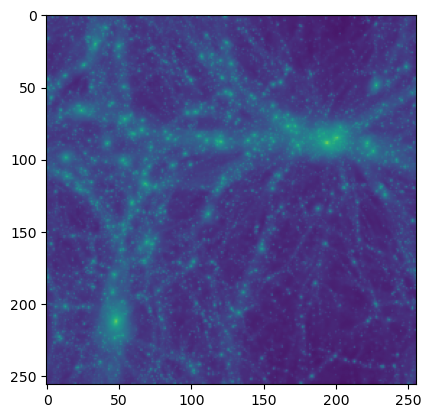

In [237]:
odata = _dataSB28
index = indices_per_bin[-1][2]
proj_map28 = np.log10(odata[index*15:index*15+5,:,:].sum(axis=0))
plt.imshow(proj_map28, vmax=16,vmin=11)
plt.show()


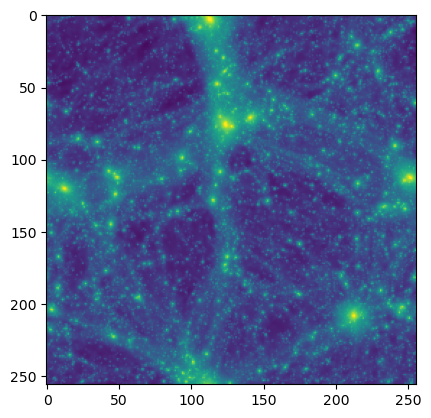

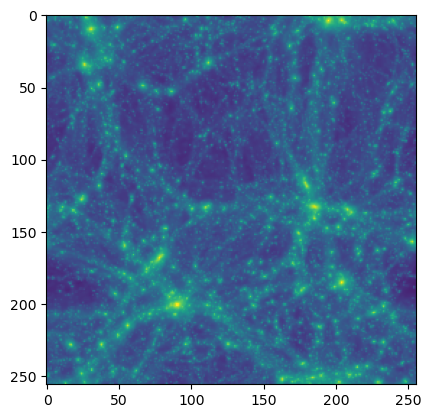

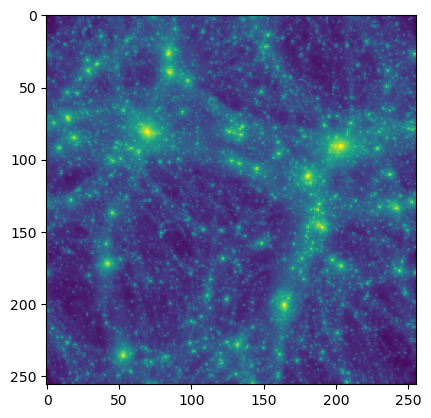

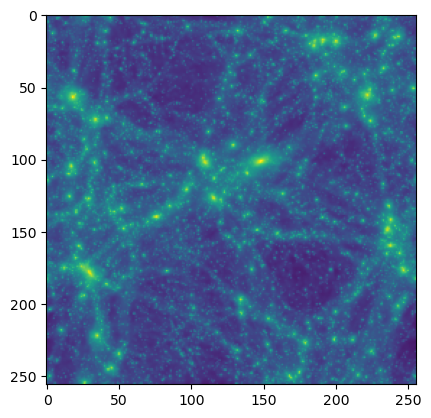

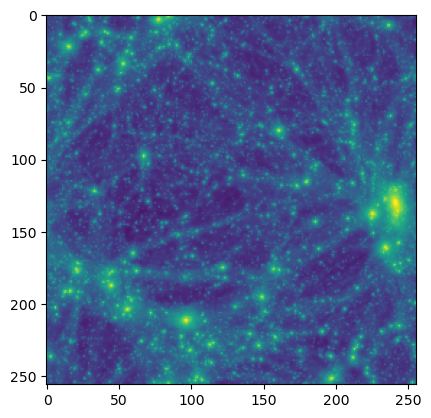

In [259]:
odata = _dataSB28
for index in indices_per_bin28[-1]:
  proj_map28 = np.log10(odata[index*15:index*15+5,:,:].mean(axis=0))
  plt.imshow(proj_map28, vmax=14,vmin=10.5)
  plt.show()

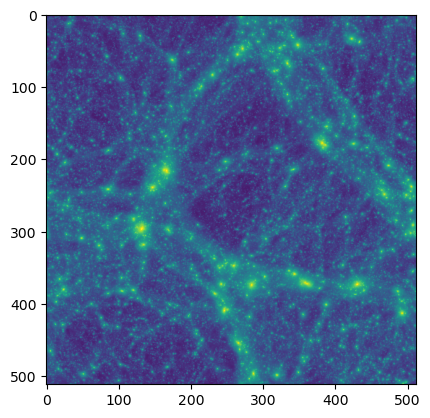

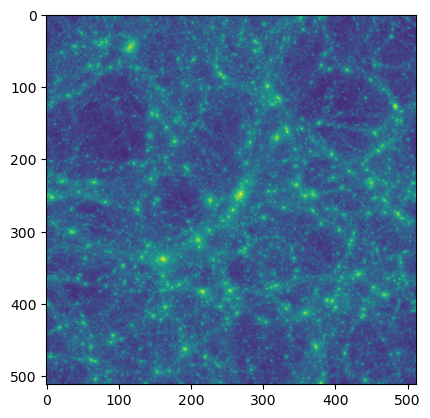

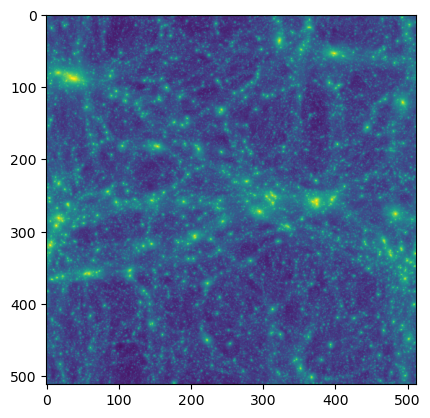

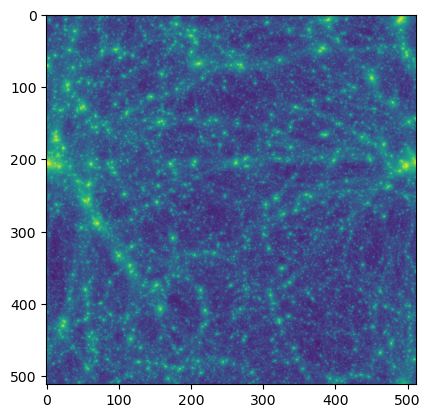

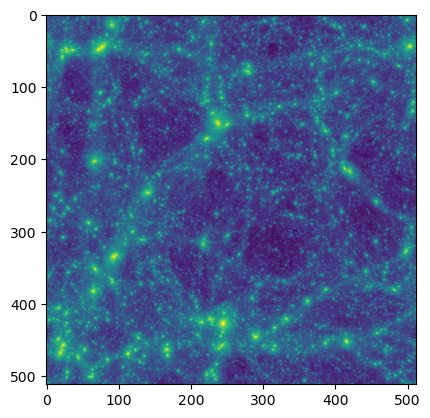

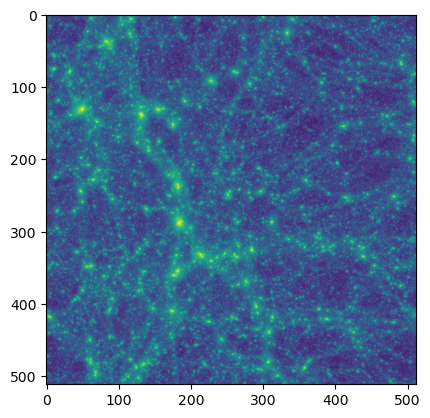

In [261]:
odata = _dataSB35
for index in indices_per_bin35[-1]:
  proj_map35 = np.log10(odata[index*30:index*30+10,:,:].mean(axis=0))
  plt.imshow(proj_map35, vmax=14,vmin=10.5)
  plt.show()

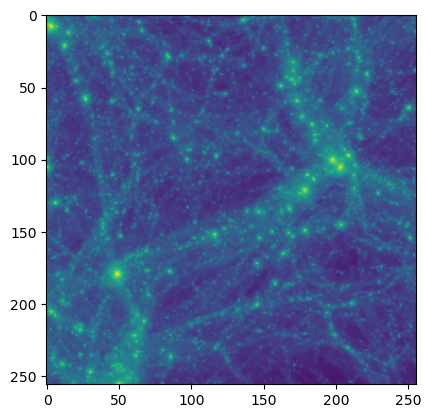

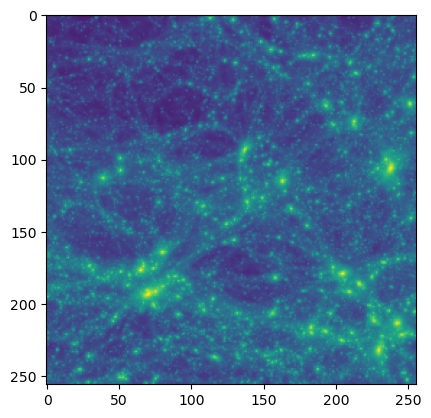

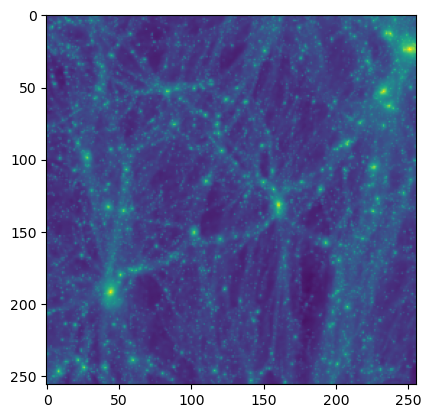

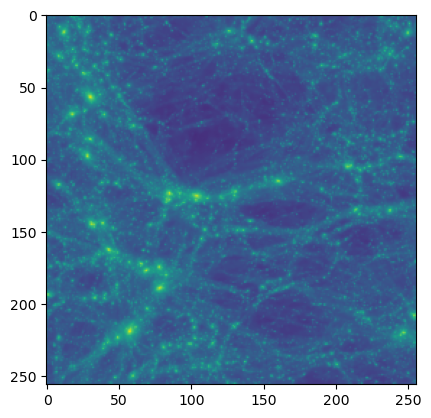

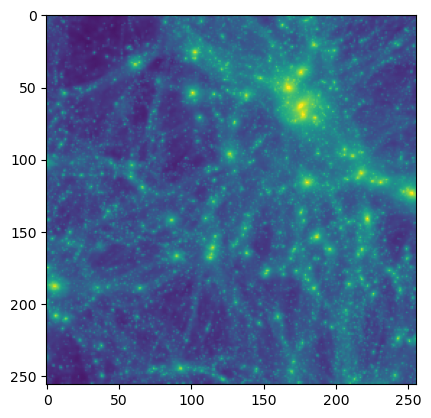

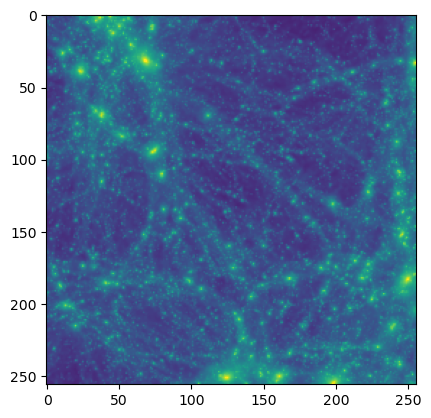

In [260]:
odata = _dataSB35
for index in indices_per_bin35[-1]:
  proj_map35 = np.log10(odata[index*15:index*15+5,:256,:256].mean(axis=0))
  plt.imshow(proj_map35, vmax=14,vmin=10.5)
  plt.show()

In [ ]:
plt.imshow([:15]][0][0,:,:].mean(axis=0))
plt.show()
plt.imshow(val_loaderSB35.dataset[index35[:30]][0][0,:,:].mean(axis=0))
plt.show()
plt.imshow(val_loaderSB35_cutout.dataset[index35_cutout[:30]][0][0,:,:].mean(axis=0))
plt.show()

### SB35

Validation MSE (average over 2 targets): 0.001750


(0.0017502827, array([0.00067343, 0.00282713], dtype=float32))

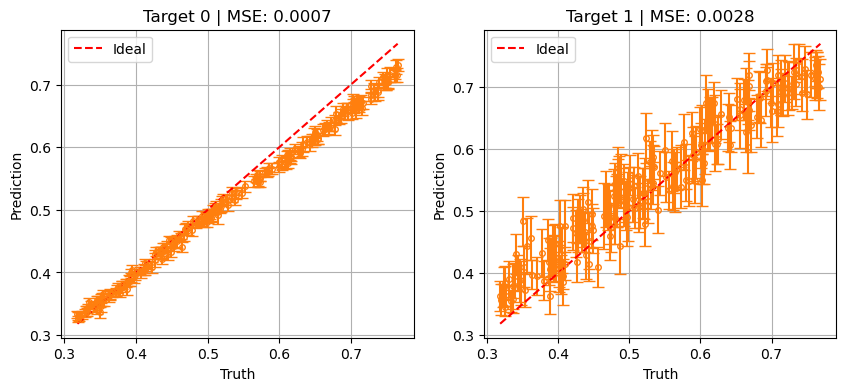

In [17]:
import validator 
importlib.reload(validator)
from validator import *
import structures
importlib.reload(structures)
from structures import *
output_dim = labelsSB28.shape[1]

model = ConventionalCNN(input_shape=(512,512), output_shape=output_dim, H=16, output_positive=True)
model.to(device)

#model.load_state_dict(torch.load("../data/models/SB28_CoaT_resize_best.pt"))
#model.load_state_dict(torch.load("../data/models/SB28_CoaT_best.pt"))
#model.load_state_dict(torch.load("../data/models/SB28_conv_no_linear_best.pt"))
model.load_state_dict(torch.load("../data/models/SB35_conv_no_linear_best.pt"))
#model.load_state_dict(torch.load("../data/models/SB28_conv_best.pt"))

#plot_per_simulation(model, train_loaderSB28, device=device, chunk_size=15)
#plot_per_simulation(model, train_loaderSB35, device=device, max_plots=6, chunk_size=30)
#plot_per_simulation(model, val_loaderSB28, device=device, chunk_size=15,num_samples=200)
plot_per_simulation(model, val_loaderSB35, device=device, max_plots=6, chunk_size=30,num_samples=200)
#plt.savefig("train_on_SB28_test_on_both.png")

### ETC

Validation MSE (average over 2 targets): 0.003441
Validation MSE (average over 2 targets): 0.004313


(0.0043126256, array([0.00120911, 0.00741615], dtype=float32))

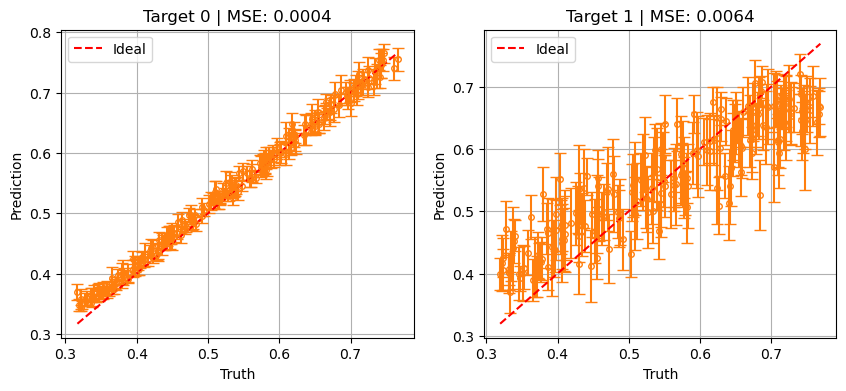

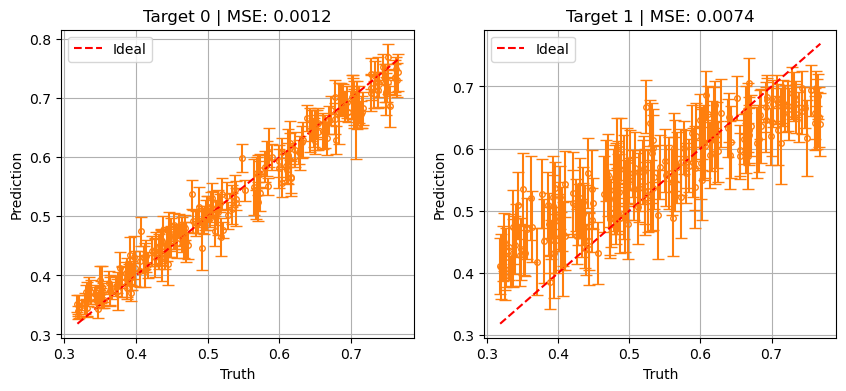

In [ ]:
import validator 
importlib.reload(validator)
from validator import *
import structures
importlib.reload(structures)
from structures import *
output_dim = labelsSB28.shape[1]

model = ConventionalCNN(input_shape=(256,256), output_shape=output_dim, H=16, output_positive=True)
model.to(device)

#model.load_state_dict(torch.load("../data/models/SB28_CoaT_resize_best.pt"))
#model.load_state_dict(torch.load("../data/models/SB28_CoaT_best.pt"))
model.load_state_dict(torch.load("../data/models/SB28_conv_no_linear_best.pt"))
#model.load_state_dict(torch.load("../data/models/SB28_conv_best.pt"))

#plot_per_simulation(model, train_loaderSB28, device=device, chunk_size=15)
#plot_per_simulation(model, train_loaderSB35, device=device, max_plots=6, chunk_size=30)
plot_per_simulation(model, val_loaderSB28, device=device, chunk_size=15,num_samples=200)
plot_per_simulation(model, val_loaderSB35, device=device, max_plots=6, chunk_size=30,num_samples=200)
#plt.savefig("train_on_SB28_test_on_both.png")

Validation MSE (average over 2 targets): 0.003504
Validation MSE (average over 2 targets): 0.003945


(0.0039450857, array([0.00088302, 0.00700715], dtype=float32))

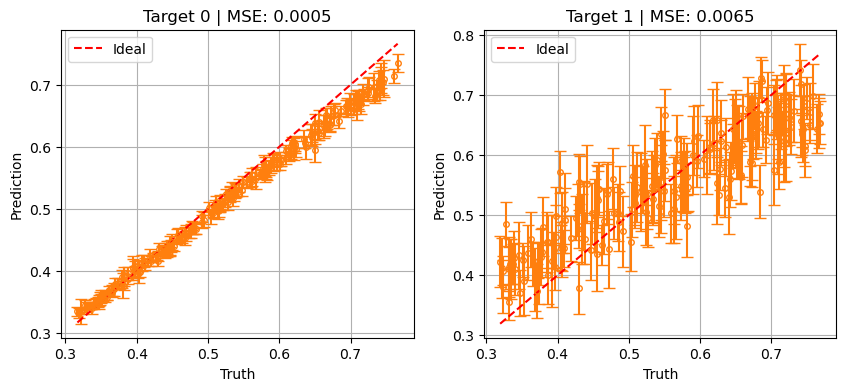

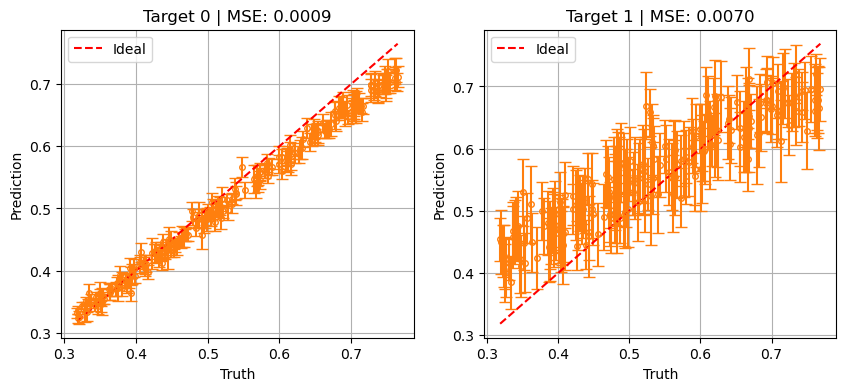

In [ ]:
import validator 
importlib.reload(validator)
from validator import *
import structures
importlib.reload(structures)
from structures import *
output_dim = labelsSB28.shape[1]

# create CoaT with 1 input channel, 1 output
model = timm.create_model(
    'coatnet_3_224',
    #'coat_lite_small',      # or any other 'coat_*' variant
    pretrained=False,
    in_chans=1,             # single‐channel input
    #num_classes=2           # single regression output
)
out_features = 1000 #model.head.out_features
# OPTIONAL: wrap the output in a tanh to bound it
model = nn.Sequential(
    model,
    nn.Linear(out_features, 256),
    nn.LeakyReLU(),
    nn.Dropout(),
    nn.Linear(256, 32),
    nn.LeakyReLU(),
    nn.Dropout(),
    nn.Linear(32, output_dim),
    nn.Sigmoid()
)
model.to(device)
#model.load_state_dict(torch.load("../data/models/SB28_CoaT_resize_best.pt"))
#model.load_state_dict(torch.load("../data/models/SB28_CoaT_best.pt"))
model.load_state_dict(torch.load("../data/models/SB28_conv_best.pt"))

#plot_per_simulation(model, train_loaderSB28, device=device, chunk_size=15)
#plot_per_simulation(model, train_loaderSB35, device=device, max_plots=6, chunk_size=30)
plot_per_simulation(model, val_loaderSB28, device=device, chunk_size=15,num_samples=200)
plot_per_simulation(model, val_loaderSB35, device=device, max_plots=6, chunk_size=30,num_samples=200)
#plt.savefig("train_on_SB28_test_on_both.png")